<img src="https://github.com/facebookresearch/detectron2/raw/main/.github/Detectron2-Logo-Horz.svg" width="300" >

Detectron2 is Facebook AI Research's next generation library
that provides state-of-the-art detection and segmentation algorithms.
It is the successor of
[Detectron](https://github.com/facebookresearch/Detectron/)
and [maskrcnn-benchmark](https://github.com/facebookresearch/maskrcnn-benchmark/).
It supports a number of computer vision research projects and production applications in Facebook.

<div align="center">
  <img src="https://user-images.githubusercontent.com/1381301/66535560-d3422200-eace-11e9-9123-5535d469db19.png"/>
</div>

Sourced from [detectron2(github)](https://github.com/facebookresearch/Detectron/)

</br>

I wrote some ideas to improve model at [Please check my ideas to improve model🙏](https://www.kaggle.com/c/petfinder-pawpularity-score/discussion/295808).
The 3 idea is "Training by using crop dogs and cats by Object Detection images", and the 4 idea is "Separate dogs and cats then train".

Thus, in this code I did object detect as a pre-process of these two ideas, I used detectron2's COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x model to detect cats and dogs.
Then I did EDA, so I show my result.

The train.csv with object detect infomation like is [petfinder2-detect-info](https://www.kaggle.com/masaishi/petfinder2-detected-info)

</br>

### Result
Cats and dogs have different pawpularity distributions.
Cats mean is 35.62513274336283, and dog one is 41.24786324786325.
Thus, dogs' image can get beter pawpularity, so the 4 idea of making model for only cats and dogs may be good.


In [1]:
import sys
import os

import albumentations
import pandas as pd
import numpy as np

import gc
from glob import glob
import pickle
import json
from pprint import pprint
import subprocess

import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T

from tqdm import tqdm

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import StratifiedKFold
from torchvision.io import read_image
from torch.utils.data import DataLoader, Dataset

In [2]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-u03wr_eb
  Running command git clone --filter=blob:none -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-u03wr_eb
  Resolved https://github.com/facebookresearch/detectron2.git to commit 085fda47bc49f2cdd9c05a895580b2b31fcdb6c3
  Preparing metadata (setup.py) ... - \ done
     |████████████████████████████████| 106 kB 638 kB/s            
  Preparing metadata (setup.py) ... - done
     |████████████████████████████████| 49 kB 2.1 MB/s            
  Preparing metadata (setup.py) ... - done
     |████████████████████████████████| 74 kB 1.4 MB/s            
     |████████████████████████████████| 145 kB 3.6 MB/s            
     |████████████████████████████████| 130 kB 7.6 MB/s            
     |████████████████████████████████| 112 kB 7.6 MB/s            
  Preparing metadata (setup.py) ... - done
  Created wheel for detectron2: filename=detectron2-0.6-cp37-cp37m-linux_x86

In [3]:
import detectron2
from detectron2.utils.logger import setup_logger

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

import cv2

from tqdm import tqdm

In [4]:
DATA_DIR = '../input/petfinder-pawpularity-score'
IMG_PATH = '../input/petfinder-pawpularity-score'

In [5]:
train_df=pd.read_csv(f'{DATA_DIR}/train.csv')
test_df=pd.read_csv(f'{DATA_DIR}/test.csv')

train_df['image_path'] = f'{IMG_PATH}/train/' + train_df['Id'] + '.jpg'
test_df['image_path'] = f'{IMG_PATH}/test/' + test_df['Id'] + '.jpg'

In [6]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

predictor = DefaultPredictor(cfg)

model_final_f10217.pkl: 178MB [00:15, 11.4MB/s]                           


Showing how to make published petfinder2-detected-info dataset.
Below program is proceses of only 16 samples.

In [7]:
MetadataCatalog.get(cfg.DATASETS.TRAIN[0])

namespace(name='coco_2017_train',
          json_file='datasets/coco/annotations/instances_train2017.json',
          image_root='datasets/coco/train2017',
          evaluator_type='coco',
          thing_dataset_id_to_contiguous_id={1: 0,
                                             2: 1,
                                             3: 2,
                                             4: 3,
                                             5: 4,
                                             6: 5,
                                             7: 6,
                                             8: 7,
                                             9: 8,
                                             10: 9,
                                             11: 10,
                                             13: 11,
                                             14: 12,
                                             15: 13,
                                             16: 14,
                                   

In [8]:
train_df['height'] = 0
train_df['width'] = 0
train_df['fields'] = ''
train_df

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,Occlusion,Info,Blur,Pawpularity,image_path,height,width,fields
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,0,0,0,63,../input/petfinder-pawpularity-score/train/000...,0,0,
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,0,0,0,42,../input/petfinder-pawpularity-score/train/000...,0,0,
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,1,0,0,28,../input/petfinder-pawpularity-score/train/001...,0,0,
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,0,0,0,15,../input/petfinder-pawpularity-score/train/001...,0,0,
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,0,0,0,72,../input/petfinder-pawpularity-score/train/001...,0,0,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,ffbfa0383c34dc513c95560d6e1fdb57,0,0,0,1,0,0,0,0,0,0,0,1,15,../input/petfinder-pawpularity-score/train/ffb...,0,0,
9908,ffcc8532d76436fc79e50eb2e5238e45,0,1,1,1,0,0,0,0,0,0,0,0,70,../input/petfinder-pawpularity-score/train/ffc...,0,0,
9909,ffdf2e8673a1da6fb80342fa3b119a20,0,1,1,1,0,0,0,0,1,1,0,0,20,../input/petfinder-pawpularity-score/train/ffd...,0,0,
9910,fff19e2ce11718548fa1c5d039a5192a,0,1,1,1,0,0,0,0,1,0,0,0,20,../input/petfinder-pawpularity-score/train/fff...,0,0,


100%|██████████| 16/16 [00:10<00:00,  1.52it/s]


CPU times: user 5.33 s, sys: 935 ms, total: 6.26 s
Wall time: 10.6 s


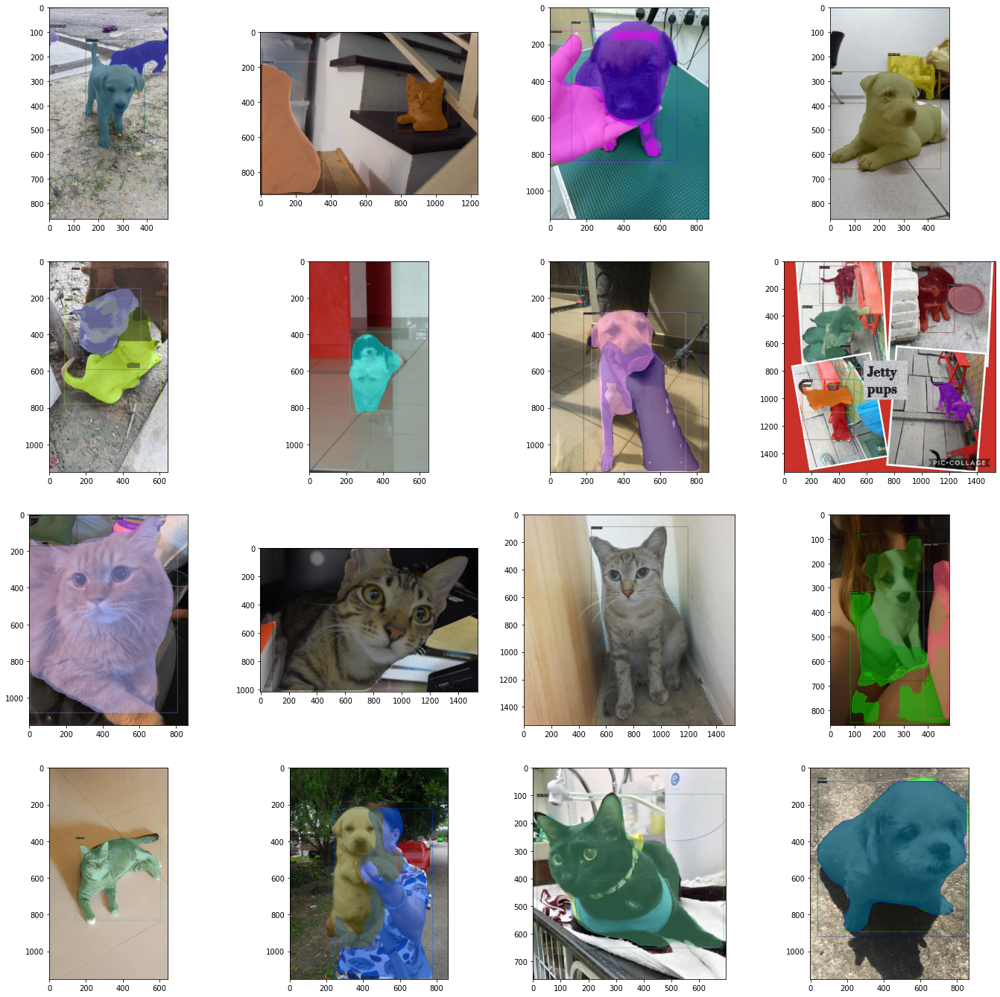

In [9]:
%%time

plt.figure(figsize=(24, 24))

# for index in tqdm(range(len(train_df))):
for index in tqdm(range(16)):
    im = cv2.imread(train_df.loc[index, 'image_path'])
    outputs = predictor(im)
    
    # Visualize
    v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    out = out.get_image()
    out = cv2.cvtColor(out, cv2.COLOR_BGR2RGB)
    plt.subplot(4, 4, index+1)
    plt.imshow(out[:, :, ::-1])
    
    # Add detect information to table
    (height, width) =  outputs['instances'].image_size
    fields = outputs['instances'].get_fields()
    fields.pop('pred_masks')

    train_df.loc[index, ['height', 'width', 'fields']] = height, width, fields
    
    

In [10]:
train_df.loc[0:15, ['image_path', 'height', 'width', 'fields']]

,image_path,height,width,fields
0,../input/petfinder-pawpularity-score/train/000...,720,405,"{'pred_boxes': ([tensor(124.4062, device='cuda..."
1,../input/petfinder-pawpularity-score/train/000...,774,1032,"{'pred_boxes': ([tensor(642.2629, device='cuda..."
2,../input/petfinder-pawpularity-score/train/001...,960,720,"{'pred_boxes': ([tensor(97.7294, device='cuda:..."
3,../input/petfinder-pawpularity-score/train/001...,720,405,"{'pred_boxes': ([tensor(5.2282, device='cuda:0..."
4,../input/petfinder-pawpularity-score/train/001...,960,540,"{'pred_boxes': ([tensor(70.1588, device='cuda:..."
5,../input/petfinder-pawpularity-score/train/001...,960,540,"{'pred_boxes': ([tensor(184.2180, device='cuda..."
6,../input/petfinder-pawpularity-score/train/002...,960,720,"{'pred_boxes': ([tensor(188.3490, device='cuda..."
7,../input/petfinder-pawpularity-score/train/003...,1280,1280,"{'pred_boxes': ([tensor(814.6140, device='cuda..."
8,../input/petfinder-pawpularity-score/train/004...,960,720,"{'pred_boxes': ([tensor(0.1362, device='cuda:0..."
9,../input/petfinder-pawpularity-score/train/004...,847,1279,"{'pred_boxes': ([tensor(74.7819, device='cuda:..."


In [11]:
train_df.loc[0, 'fields']

{'pred_boxes': Boxes(tensor([[1.2441e+02, 1.0864e+02, 3.2429e+02, 4.7420e+02],
         [1.9671e+02, 6.8712e+01, 4.0500e+02, 2.3258e+02],
         [1.8231e+02, 6.1418e+01, 2.2594e+02, 8.0784e+01],
         [5.6150e-02, 5.9586e+01, 3.1870e+01, 1.2396e+02]], device='cuda:0')),
 'scores': tensor([0.9971, 0.9868, 0.9324, 0.6892], device='cuda:0'),
 'pred_classes': tensor([16, 16, 45, 20], device='cuda:0')}

In [12]:
train_df['Persons'] = 0
train_df['Cats'] = 0
train_df['Dogs'] = 0
train_df

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,...,Info,Blur,Pawpularity,image_path,height,width,fields,Persons,Cats,Dogs
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,...,0,0,63,../input/petfinder-pawpularity-score/train/000...,720,405,"{'pred_boxes': ([tensor(124.4062, device='cuda...",0,0,0
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,...,0,0,42,../input/petfinder-pawpularity-score/train/000...,774,1032,"{'pred_boxes': ([tensor(642.2629, device='cuda...",0,0,0
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,...,0,0,28,../input/petfinder-pawpularity-score/train/001...,960,720,"{'pred_boxes': ([tensor(97.7294, device='cuda:...",0,0,0
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,...,0,0,15,../input/petfinder-pawpularity-score/train/001...,720,405,"{'pred_boxes': ([tensor(5.2282, device='cuda:0...",0,0,0
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,...,0,0,72,../input/petfinder-pawpularity-score/train/001...,960,540,"{'pred_boxes': ([tensor(70.1588, device='cuda:...",0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,ffbfa0383c34dc513c95560d6e1fdb57,0,0,0,1,0,0,0,0,0,...,0,1,15,../input/petfinder-pawpularity-score/train/ffb...,0,0,,0,0,0
9908,ffcc8532d76436fc79e50eb2e5238e45,0,1,1,1,0,0,0,0,0,...,0,0,70,../input/petfinder-pawpularity-score/train/ffc...,0,0,,0,0,0
9909,ffdf2e8673a1da6fb80342fa3b119a20,0,1,1,1,0,0,0,0,1,...,0,0,20,../input/petfinder-pawpularity-score/train/ffd...,0,0,,0,0,0
9910,fff19e2ce11718548fa1c5d039a5192a,0,1,1,1,0,0,0,0,1,...,0,0,20,../input/petfinder-pawpularity-score/train/fff...,0,0,,0,0,0


In [13]:
# for index in tqdm(range(len(train_df))):
for index in tqdm(range(16)):
    train_df.loc[index, 'Persons'] = train_df.loc[index, 'fields']['pred_classes'].tolist().count(0)
    train_df.loc[index, 'Cats'] = train_df.loc[index, 'fields']['pred_classes'].tolist().count(15)
    train_df.loc[index, 'Dogs'] = train_df.loc[index, 'fields']['pred_classes'].tolist().count(16)
train_df.loc[:15]

100%|██████████| 16/16 [00:00<00:00, 673.63it/s]


,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,...,Info,Blur,Pawpularity,image_path,height,width,fields,Persons,Cats,Dogs
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,...,0,0,63,../input/petfinder-pawpularity-score/train/000...,720,405,"{'pred_boxes': ([tensor(124.4062, device='cuda...",0,0,2
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,...,0,0,42,../input/petfinder-pawpularity-score/train/000...,774,1032,"{'pred_boxes': ([tensor(642.2629, device='cuda...",1,1,0
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,...,0,0,28,../input/petfinder-pawpularity-score/train/001...,960,720,"{'pred_boxes': ([tensor(97.7294, device='cuda:...",1,0,1
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,...,0,0,15,../input/petfinder-pawpularity-score/train/001...,720,405,"{'pred_boxes': ([tensor(5.2282, device='cuda:0...",0,0,1
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,...,0,0,72,../input/petfinder-pawpularity-score/train/001...,960,540,"{'pred_boxes': ([tensor(70.1588, device='cuda:...",0,2,1
5,001dd4f6fafb890610b1635f967ea081,0,0,1,0,0,0,0,0,0,...,0,1,74,../input/petfinder-pawpularity-score/train/001...,960,540,"{'pred_boxes': ([tensor(184.2180, device='cuda...",0,0,1
6,0023b8a3abc93c712edd6120867deb53,0,1,1,1,0,0,0,0,1,...,0,0,22,../input/petfinder-pawpularity-score/train/002...,960,720,"{'pred_boxes': ([tensor(188.3490, device='cuda...",1,0,1
7,0031d6a9ef7340f898c3e05f92c7bb04,0,1,1,0,0,0,1,1,0,...,1,0,35,../input/petfinder-pawpularity-score/train/003...,1280,1280,"{'pred_boxes': ([tensor(814.6140, device='cuda...",0,0,6
8,0042bc5bada6d1cf8951f8f9f0d399fa,0,1,1,1,0,0,0,0,0,...,0,0,53,../input/petfinder-pawpularity-score/train/004...,960,720,"{'pred_boxes': ([tensor(0.1362, device='cuda:0...",2,1,0
9,0049cb81313c94fa007286e9039af910,0,1,1,1,0,0,0,0,0,...,0,0,21,../input/petfinder-pawpularity-score/train/004...,847,1279,"{'pred_boxes': ([tensor(74.7819, device='cuda:...",0,1,0


By doing that procese, I generate petfinder2-detected-info dataset.

# EDA of detect info

In [14]:
DATA_DIR = '../input/petfinder2-detected-info'

train_df=pd.read_csv(f'{DATA_DIR}/train.csv')
train_df['image_path'] = f'{IMG_PATH}/train/' + train_df['Id'] + '.jpg'
train_df

,Id,Subject Focus,Eyes,Face,Near,Action,Accessory,Group,Collage,Human,...,Info,Blur,Pawpularity,image_path,height,width,fields,Persons,Cats,Dogs
0,0007de18844b0dbbb5e1f607da0606e0,0,1,1,1,0,0,1,0,0,...,0,0,63,../input/petfinder-pawpularity-score/train/000...,720,405,"{'pred_boxes': Boxes(tensor([[1.2441e+02, 1.08...",0,0,2
1,0009c66b9439883ba2750fb825e1d7db,0,1,1,0,0,0,0,0,0,...,0,0,42,../input/petfinder-pawpularity-score/train/000...,774,1032,"{'pred_boxes': Boxes(tensor([[642.2629, 204.08...",1,1,0
2,0013fd999caf9a3efe1352ca1b0d937e,0,1,1,1,0,0,0,0,1,...,0,0,28,../input/petfinder-pawpularity-score/train/001...,960,720,"{'pred_boxes': Boxes(tensor([[ 97.7294, 64.56...",1,0,1
3,0018df346ac9c1d8413cfcc888ca8246,0,1,1,1,0,0,0,0,0,...,0,0,15,../input/petfinder-pawpularity-score/train/001...,720,405,"{'pred_boxes': Boxes(tensor([[ 5.2282, 219.55...",0,0,1
4,001dc955e10590d3ca4673f034feeef2,0,0,0,1,0,0,1,0,0,...,0,0,72,../input/petfinder-pawpularity-score/train/001...,960,540,"{'pred_boxes': Boxes(tensor([[ 70.1588, 172.69...",0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,ffbfa0383c34dc513c95560d6e1fdb57,0,0,0,1,0,0,0,0,0,...,0,1,15,../input/petfinder-pawpularity-score/train/ffb...,960,786,"{'pred_boxes': Boxes(tensor([[ 5.7870, 82.12...",0,1,0
9908,ffcc8532d76436fc79e50eb2e5238e45,0,1,1,1,0,0,0,0,0,...,0,0,70,../input/petfinder-pawpularity-score/train/ffc...,960,720,"{'pred_boxes': Boxes(tensor([[215.7536, 168.15...",0,0,1
9909,ffdf2e8673a1da6fb80342fa3b119a20,0,1,1,1,0,0,0,0,1,...,0,0,20,../input/petfinder-pawpularity-score/train/ffd...,896,696,"{'pred_boxes': Boxes(tensor([[ 9.5539, 64.00...",1,1,0
9910,fff19e2ce11718548fa1c5d039a5192a,0,1,1,1,0,0,0,0,1,...,0,0,20,../input/petfinder-pawpularity-score/train/fff...,960,720,"{'pred_boxes': Boxes(tensor([[202.6625, 172.84...",0,0,1


## Image Size

(array([  10.,   67.,  115.,  278.,  441., 1240.,  408., 6900.,   48.,
         405.]),
 array([ 113. ,  229.7,  346.4,  463.1,  579.8,  696.5,  813.2,  929.9,
        1046.6, 1163.3, 1280. ]),
 <BarContainer object of 10 artists>)

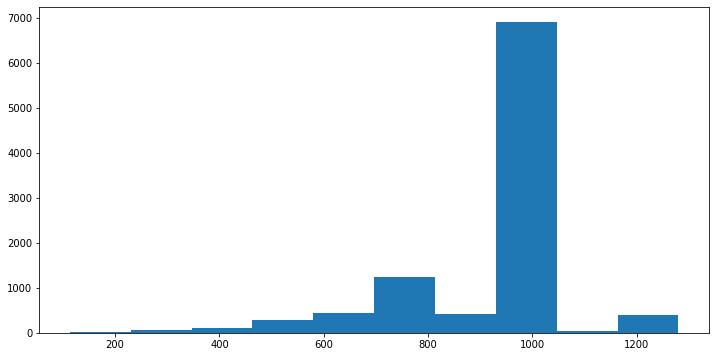

In [15]:
plt.figure(figsize=(12, 6))
plt.hist(train_df['height'])

(array([  10.,  127.,  457., 1362.,  592., 4192.,  282.,  775.,  336.,
        1779.]),
 array([  90.,  209.,  328.,  447.,  566.,  685.,  804.,  923., 1042.,
        1161., 1280.]),
 <BarContainer object of 10 artists>)

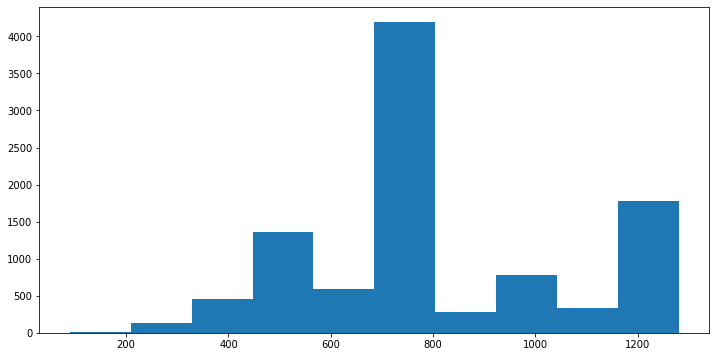

In [16]:
plt.figure(figsize=(12, 6))
plt.hist(train_df['width'])

(array([   7.,   67.,  123.,  531.,  303., 1781., 4647.,  980., 1044.,
         429.]),
 array([ 210.,  445.,  680.,  915., 1150., 1385., 1620., 1855., 2090.,
        2325., 2560.]),
 <BarContainer object of 10 artists>)

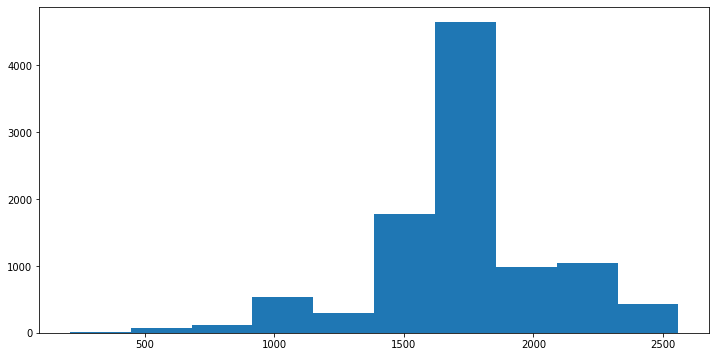

In [17]:
plt.figure(figsize=(12, 6))
plt.hist(train_df['height'] + train_df['width'])

## Persons

(array([8.158e+03, 1.187e+03, 3.970e+02, 0.000e+00, 1.090e+02, 4.800e+01,
        0.000e+00, 8.000e+00, 4.000e+00, 1.000e+00]),
 array([0. , 0.7, 1.4, 2.1, 2.8, 3.5, 4.2, 4.9, 5.6, 6.3, 7. ]),
 <BarContainer object of 10 artists>)

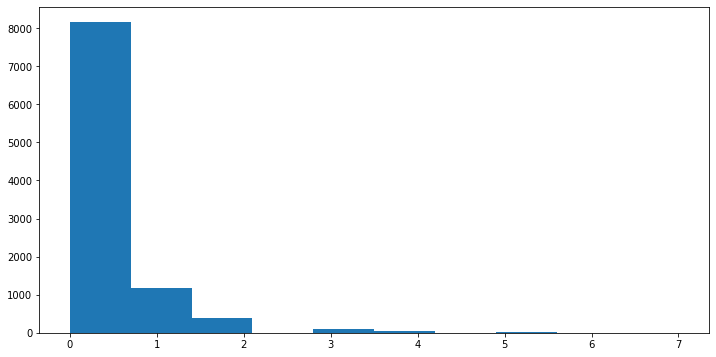

In [18]:
plt.figure(figsize=(12, 6))
plt.hist(train_df['Persons'])

37.99276783525374 38.254275940706954


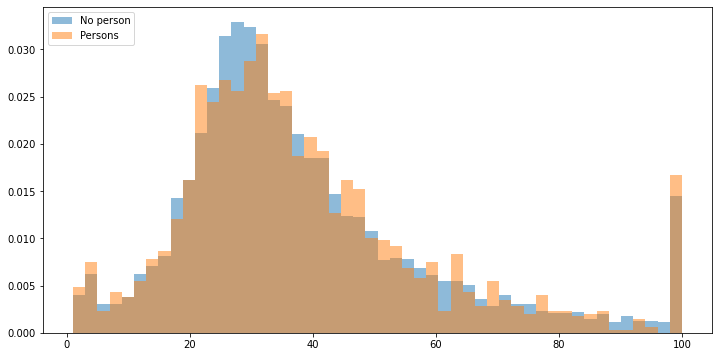

In [19]:
# Reason only plot 5 cats are the number of sample is too small over 5 cats.
print(train_df[train_df['Persons']==0]['Pawpularity'].mean(), train_df[train_df['Persons']>0]['Pawpularity'].mean())

plt.figure(figsize=(12, 6))
plt.hist(train_df[train_df['Persons']==0]['Pawpularity'], 50, alpha = 0.5, label=f'No person', density=True, stacked=True)
plt.hist(train_df[train_df['Persons']>0]['Pawpularity'], 50, alpha = 0.5, label=f'Persons', density=True, stacked=True)
plt.legend(loc='upper left')

In [20]:
# Compare to labeled data
b_same_sum = sum((train_df['Human']) == (train_df['Persons'] > 0))
print(f'Both of labels is same {b_same_sum}')
print(f'Different labels {len(train_df) - b_same_sum}')

Both of labels is same 8896
Different labels 1016


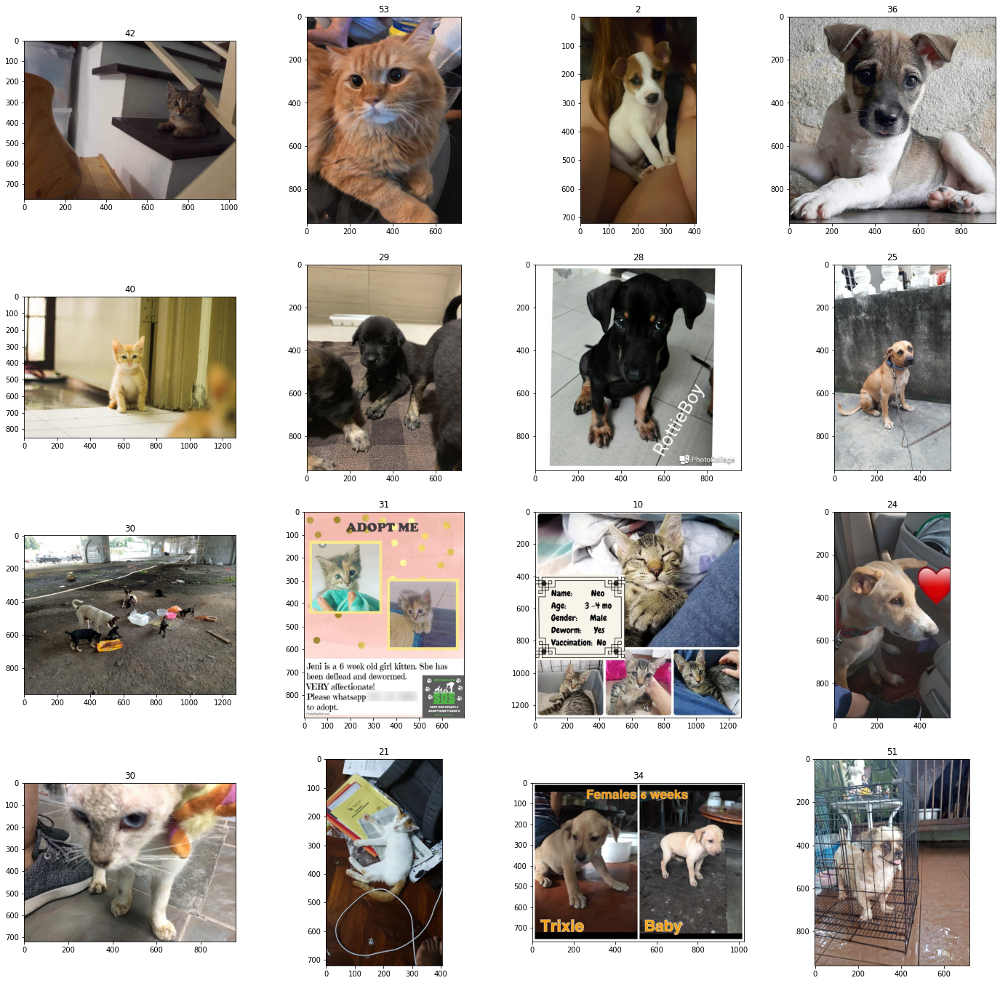

In [21]:
# Human label is 0 but detectron2 detect human
specific_train = train_df[(train_df['Human'] == 0) & (train_df['Persons'] > 0)]

plt.figure(figsize=(24, 24))

# for index in tqdm(range(len(train_df))):
for index in range(16):
    im = cv2.imread(specific_train.iloc[index]['image_path'])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    plt.subplot(4, 4, index+1)
    plt.title(specific_train.iloc[index]['Pawpularity'])
    plt.imshow(im)

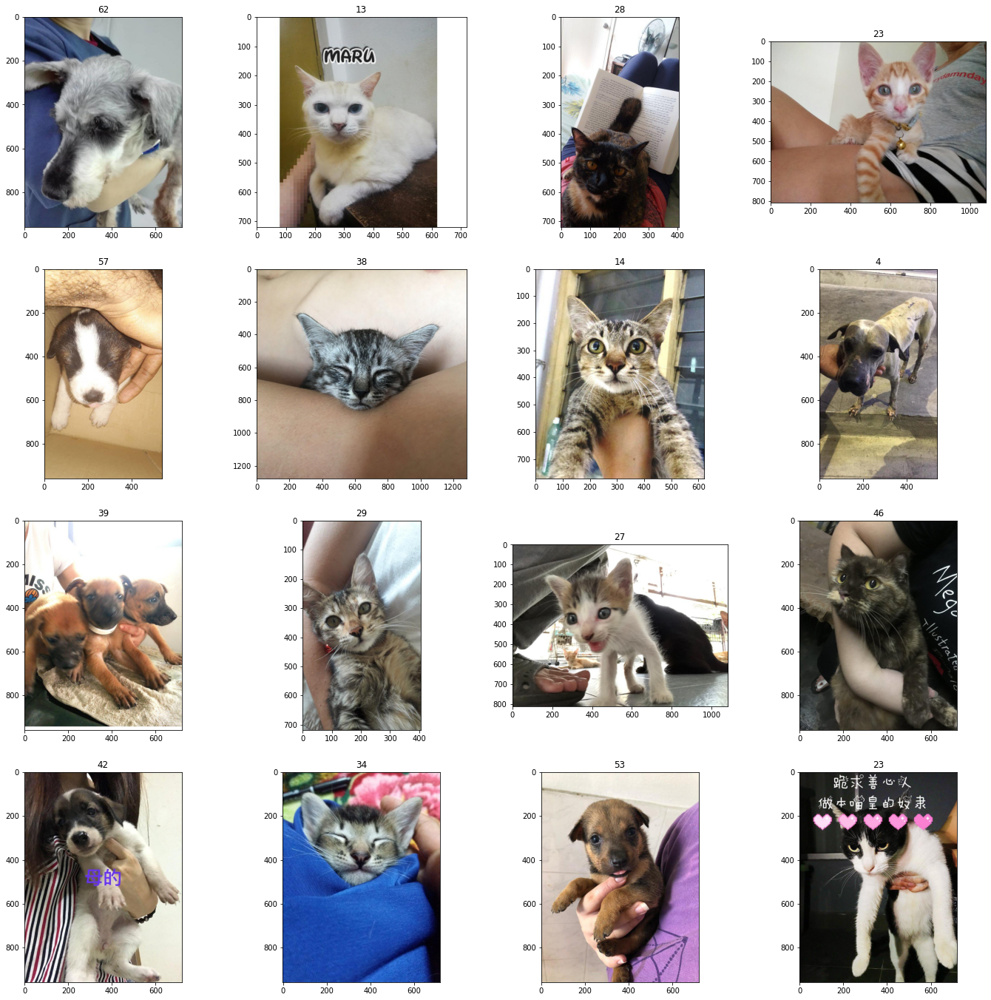

In [22]:
# Human label is 1 but detectron2 can't detect human
specific_train = train_df[(train_df['Human'] == 1) & (train_df['Persons'] == 0)]

plt.figure(figsize=(24, 24))

# for index in tqdm(range(len(train_df))):
for index in range(16):
    im = cv2.imread(specific_train.iloc[index]['image_path'])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    plt.subplot(4, 4, index+1)
    plt.title(specific_train.iloc[index]['Pawpularity'])
    plt.imshow(im)

## Cats and Dogs

### Cats

In [23]:
len(train_df[train_df['Cats'] > 0])

5650

(array([8.621e+03, 8.230e+02, 2.690e+02, 1.050e+02, 5.200e+01, 2.100e+01,
        1.300e+01, 5.000e+00, 2.000e+00, 1.000e+00]),
 array([ 0. ,  1.1,  2.2,  3.3,  4.4,  5.5,  6.6,  7.7,  8.8,  9.9, 11. ]),
 <BarContainer object of 10 artists>)

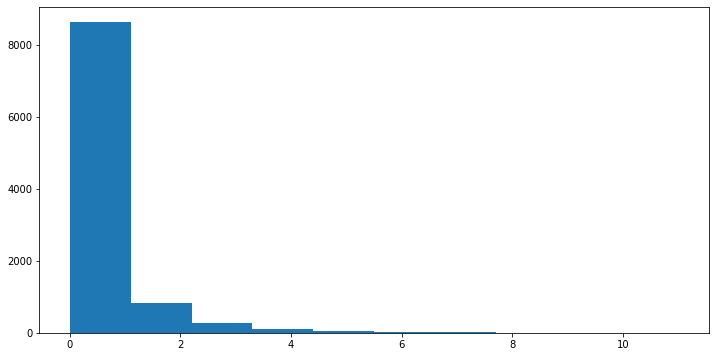

In [24]:
plt.figure(figsize=(12, 6))
plt.hist(train_df['Cats'])

4359 35.70841936223905
823 34.682867557715674
269 36.066914498141266


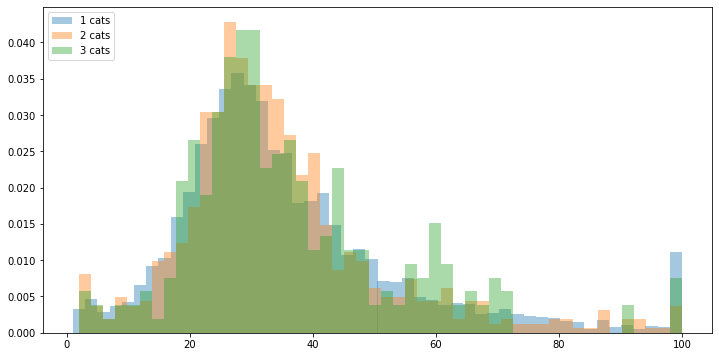

In [25]:
# Reason only plot 5 cats are the number of sample is too small over 5 cats.
plt.figure(figsize=(12, 6))
for i in range(1, 4):
    print(len(train_df[train_df['Cats']==i]), train_df[train_df['Cats']==i]['Pawpularity'].mean())
    plt.hist(train_df[train_df['Cats']==i]['Pawpularity'], 50, alpha = 0.4, label=f'{i} cats', density=True, stacked=True)
plt.legend(loc='upper left')

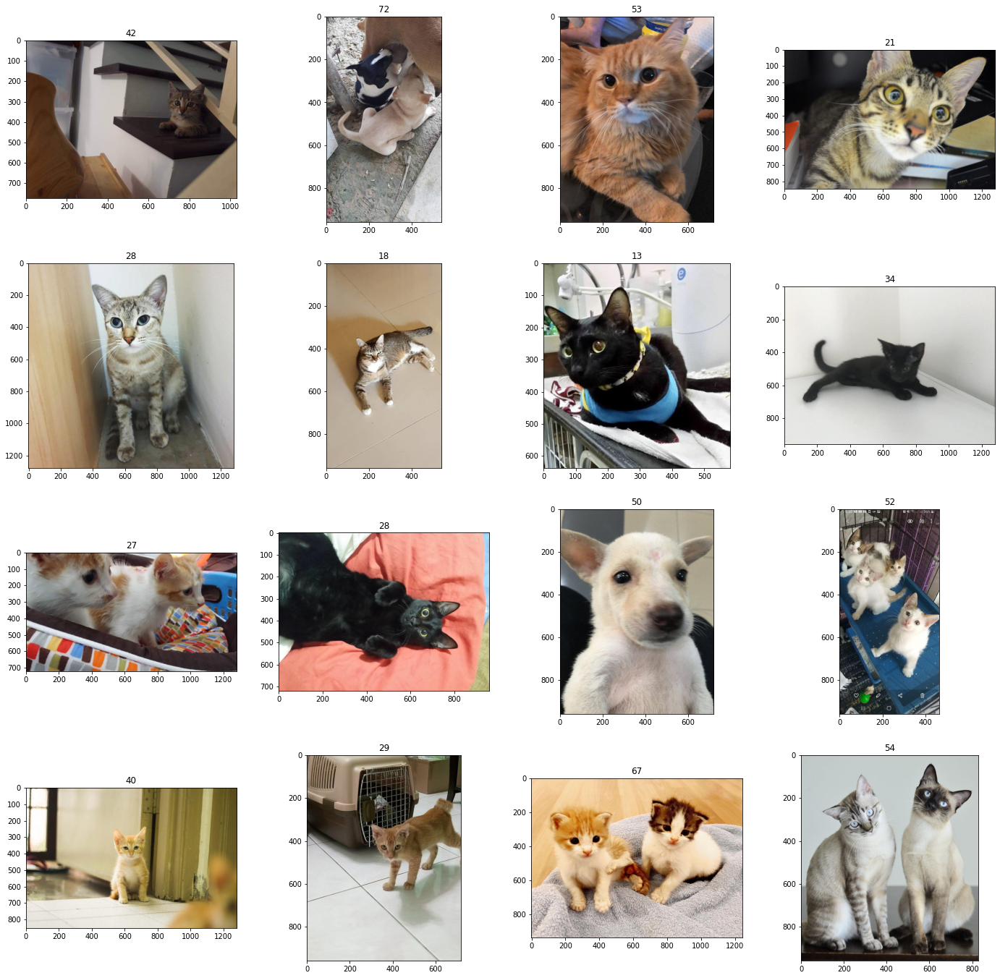

In [26]:
# Cat pictures
specific_train = train_df[train_df['Cats'] > 0]

plt.figure(figsize=(24, 24))

# for index in tqdm(range(len(train_df))):
for index in range(16):
    im = cv2.imread(specific_train.iloc[index]['image_path'])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    plt.subplot(4, 4, index+1)
    plt.title(specific_train.iloc[index]['Pawpularity'])
    plt.imshow(im)

### Dogs

In [27]:
len(train_df[train_df['Dogs'] > 0])

4797

(array([8.898e+03, 6.510e+02, 1.870e+02, 7.900e+01, 4.200e+01, 2.200e+01,
        1.800e+01, 5.000e+00, 3.000e+00, 7.000e+00]),
 array([ 0. ,  1.1,  2.2,  3.3,  4.4,  5.5,  6.6,  7.7,  8.8,  9.9, 11. ]),
 <BarContainer object of 10 artists>)

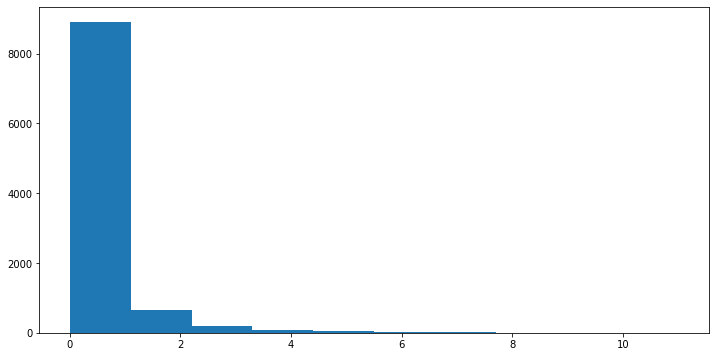

In [28]:
plt.figure(figsize=(12, 6))
plt.hist(train_df['Dogs'])

3783 41.2609040444092
651 40.19969278033794
187 41.13903743315508


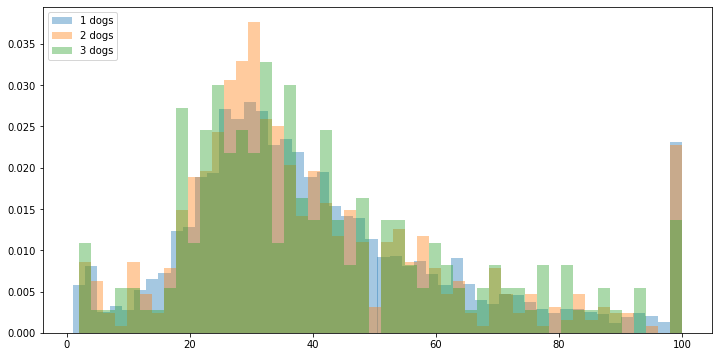

In [29]:
plt.figure(figsize=(12, 6))
for i in range(1, 4):
    print(len(train_df[train_df['Dogs']==i]), train_df[train_df['Dogs']==i]['Pawpularity'].mean())
    plt.hist(train_df[train_df['Dogs']==i]['Pawpularity'], 50, alpha = 0.4, label=f'{i} dogs', density=True, stacked=True)
plt.legend(loc='upper left')

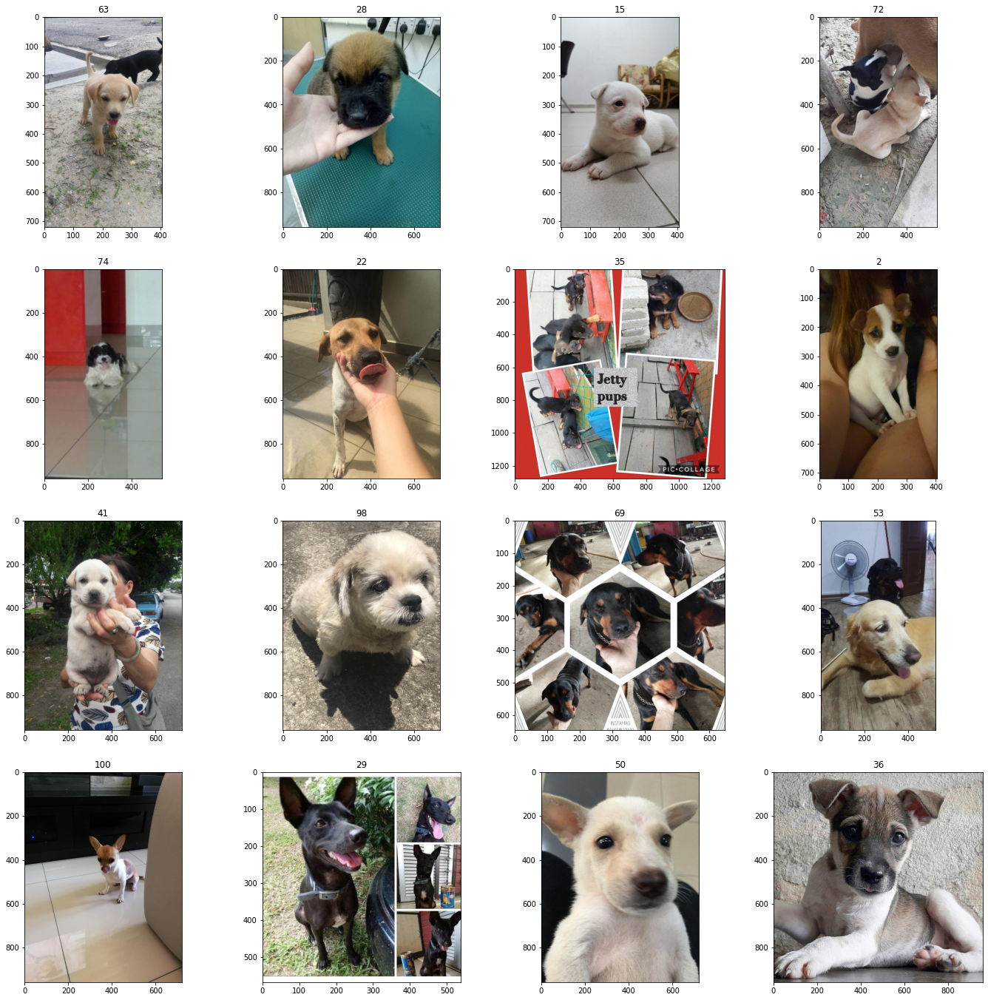

In [30]:
# Cat pictures
specific_train = train_df[train_df['Dogs'] > 0]

plt.figure(figsize=(24, 24))

# for index in tqdm(range(len(train_df))):
for index in range(16):
    im = cv2.imread(specific_train.iloc[index]['image_path'])
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    plt.subplot(4, 4, index+1)
    plt.title(specific_train.iloc[index]['Pawpularity'])
    plt.imshow(im)

## Compare Dog and Cat

In [31]:
print('Cats and Dog mean')
print(train_df[train_df['Cats']>0]['Pawpularity'].mean(), train_df[train_df['Dogs']>0]['Pawpularity'].mean())

Cats and Dog mean
35.62513274336283 41.24786324786325


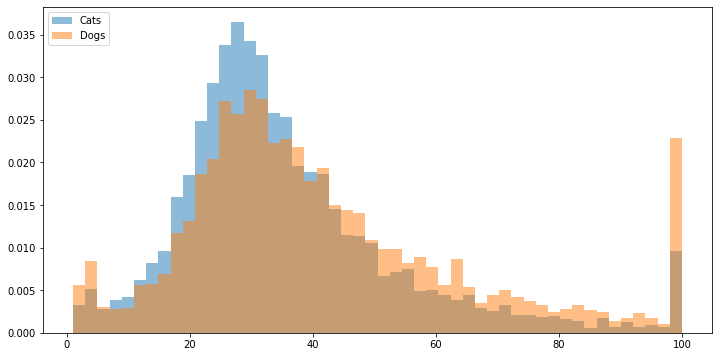

In [32]:
# Normalized histgram
plt.figure(figsize=(12, 6))
plt.hist(train_df[train_df['Cats']>0]['Pawpularity'], 50, alpha = 0.5, label='Cats', density=True, stacked=True)
plt.hist(train_df[train_df['Dogs']>0]['Pawpularity'], 50, alpha = 0.5, label='Dogs', density=True, stacked=True)
plt.legend(loc='upper left')

In [33]:
# The number of animals
train_df['Animals'] = train_df['Cats'] + train_df['Dogs']

113 43.469026548672566
7161 37.7989107666527
1671 38.10652304009575
512 37.828125
223 38.062780269058294


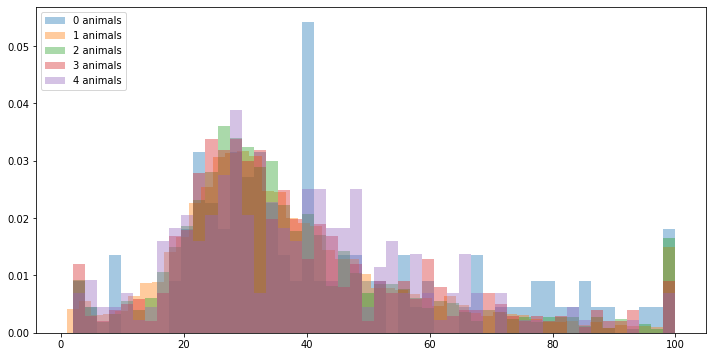

In [34]:
plt.figure(figsize=(12, 6))
for i in range(0, 5):
    print(len(train_df[train_df['Animals']==i]), train_df[train_df['Animals']==i]['Pawpularity'].mean())
    plt.hist(train_df[train_df['Animals']==i]['Pawpularity'], 50, alpha = 0.4, label=f'{i} animals', density=True, stacked=True)
plt.legend(loc='upper left')

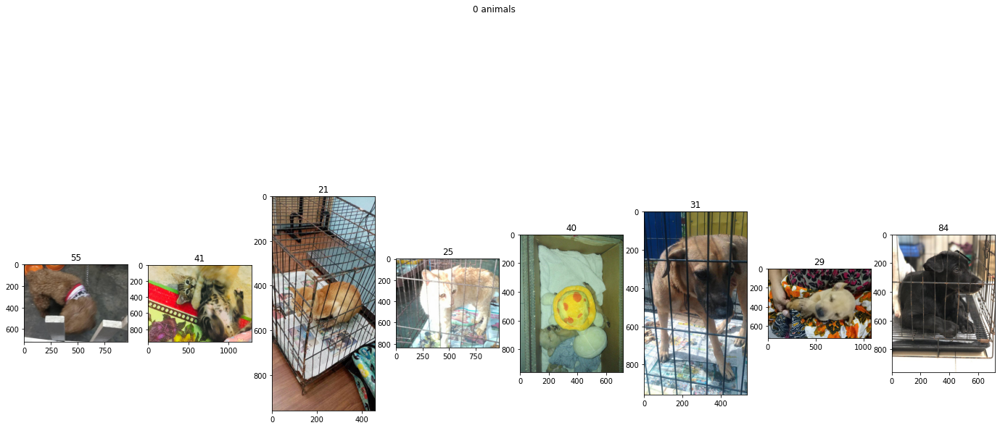

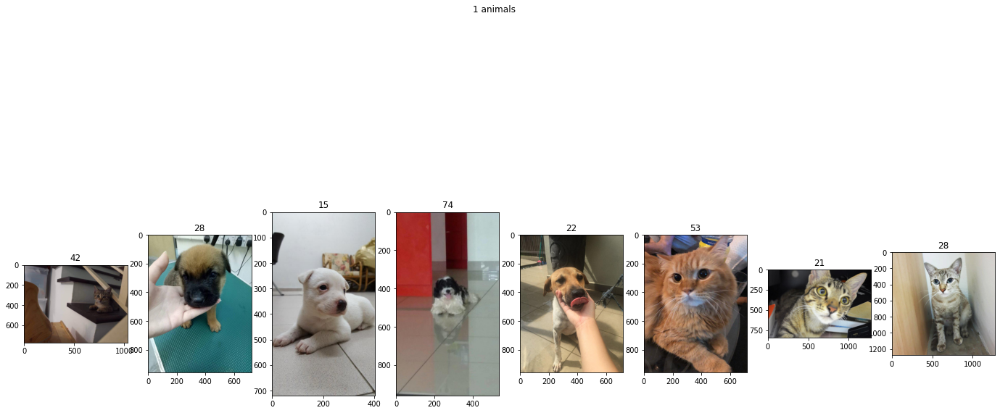

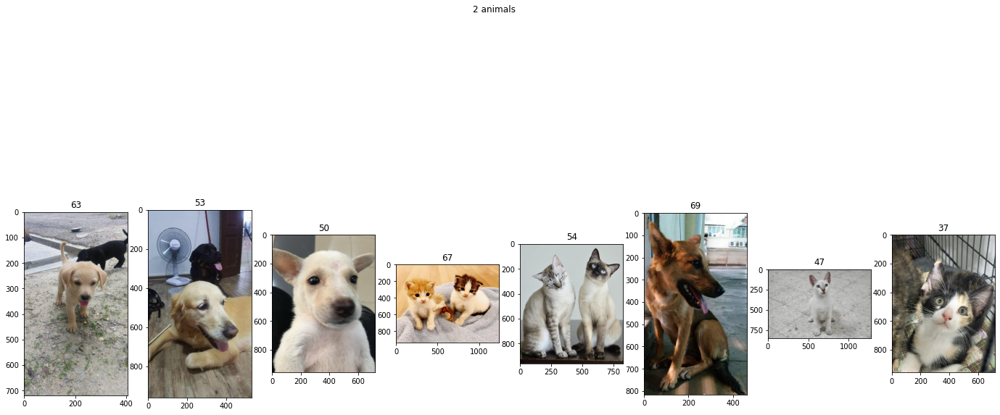

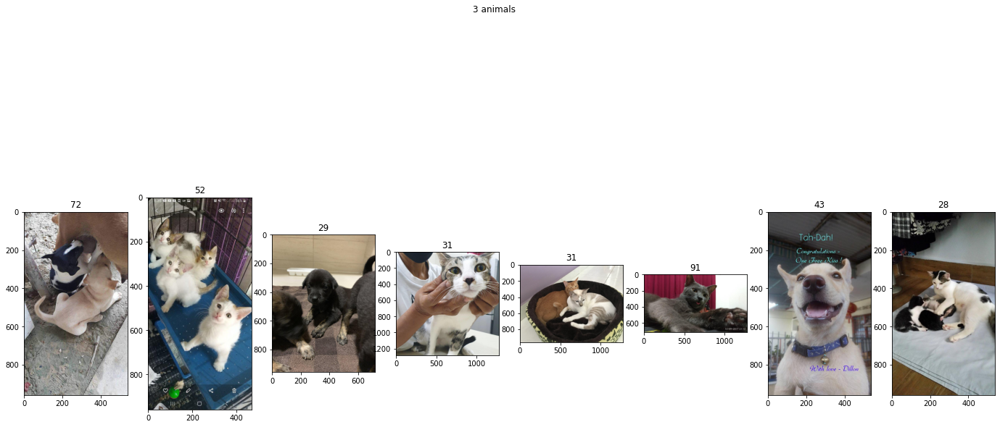

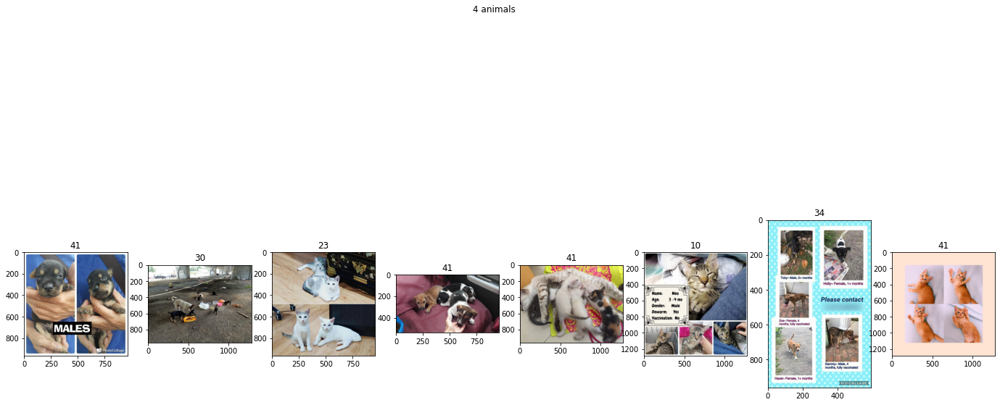

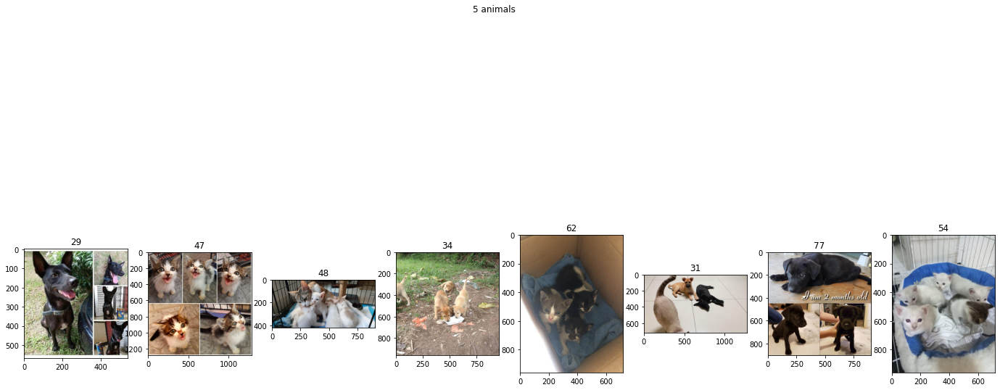

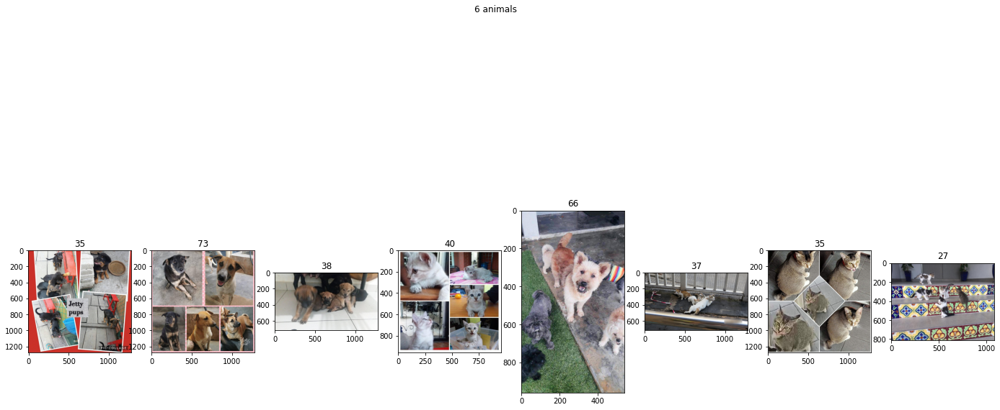

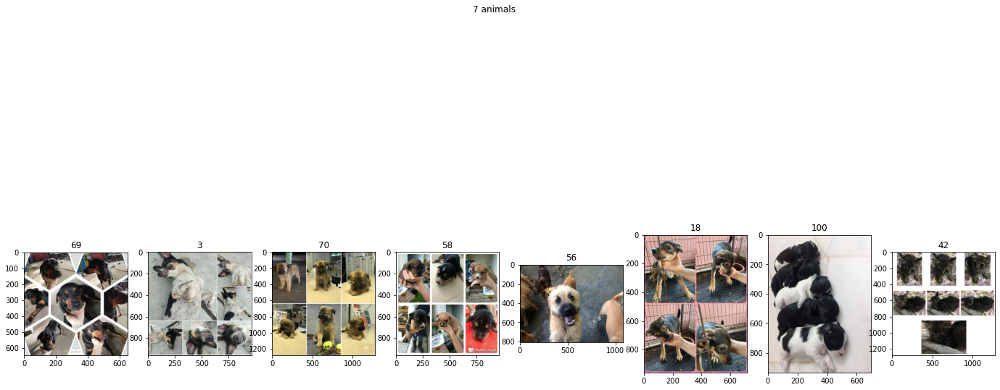

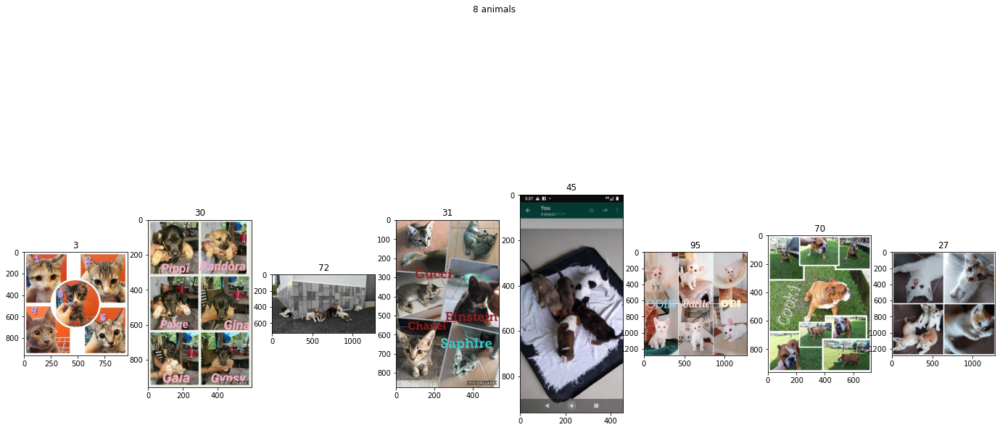

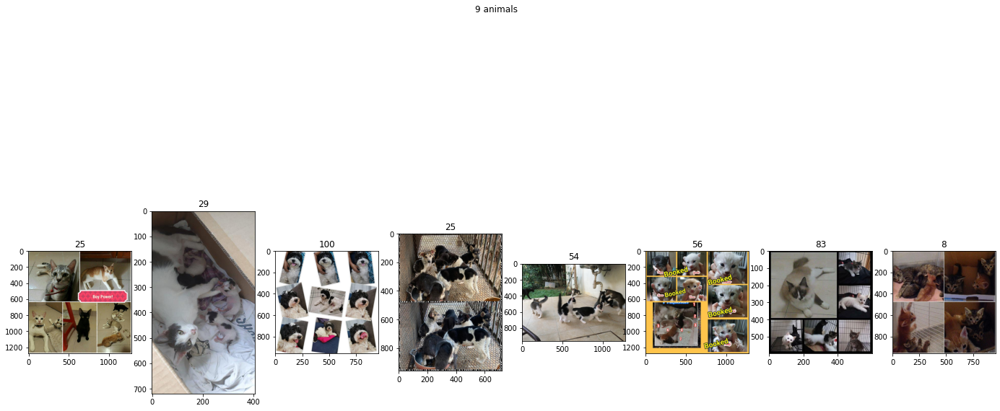

In [35]:
# Showing pictures
for i in range(0, 10):
    # Cat pictures
    specific_train = train_df[train_df['Animals']==i]
    
    plt.figure(figsize=(24, 12))
    plt.suptitle(f'{i} animals')

    # for index in tqdm(range(len(train_df))):
    for index in range(8):
        im = cv2.imread(specific_train.iloc[index]['image_path'])
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        
        plt.subplot(1, 8, index+1)
        plt.title(specific_train.iloc[index]['Pawpularity'])
        plt.imshow(im)